# Plot the motivation data

In [8]:
import matplotlib.pyplot as plt
import os
import glob
import numpy as np
import json
from collections import defaultdict
%matplotlib notebook

In [2]:
results_root = '/home/romilb/research/msr/results/motivation/10tasks_10epochs/'
#result_dir = '/home/romilb/research/msr/results/motivation/10tasks/plots'
os.makedirs(result_dir, exist_ok=True)

NameError: name 'result_dir' is not defined

In [3]:
def get_data(city, results_root, suffix="_pretrained_result.json"):
    json_path = os.path.join(results_root, city + suffix)
    with open(json_path) as json_file:
        data = json.load(json_file)
    task_ids, accs = zip(*data['test_acc'].items())
    task_ids = [int(x) for x in task_ids]
    return task_ids, accs

## Plot single experiment

In [3]:
pretrained_files = (glob.glob(results_root + "*_retraining_result.json"))
city_names = [os.path.basename(x).split('_retraining_result.json')[0] for x in pretrained_files]
print(city_names)

['krefeld', 'hanover', 'bochum', 'stuttgart', 'cologne', 'dusseldorf', 'hamburg', 'strasbourg', 'zurich', 'weimar', 'bremen', 'ulm', 'aachen', 'monchengladbach', 'jena', 'darmstadt', 'erfurt', 'tubingen']


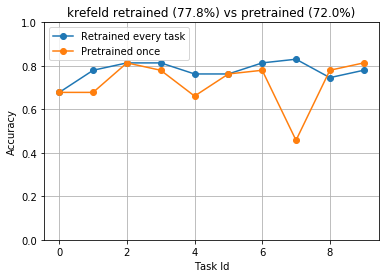

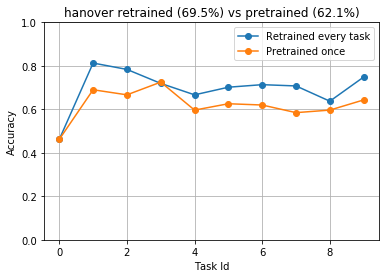

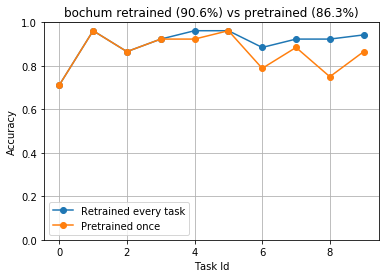

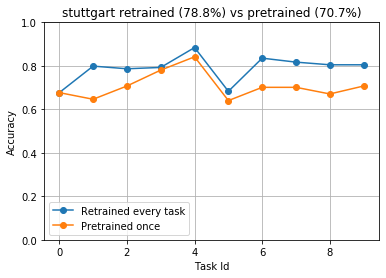

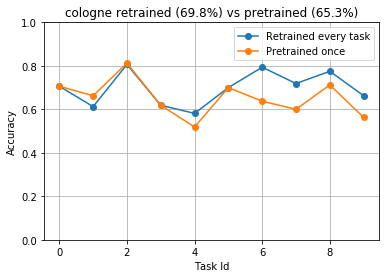

...

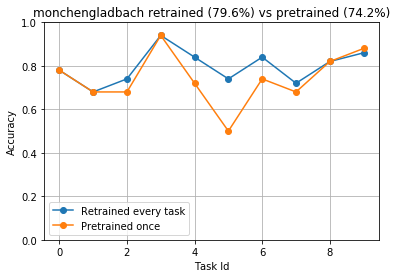

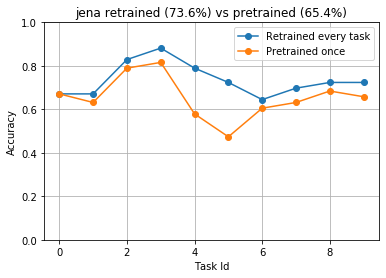

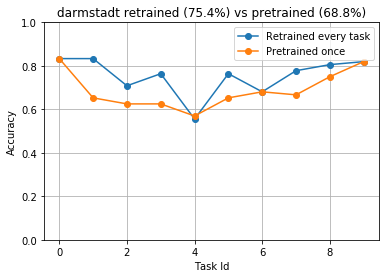

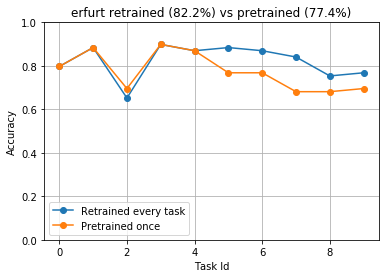

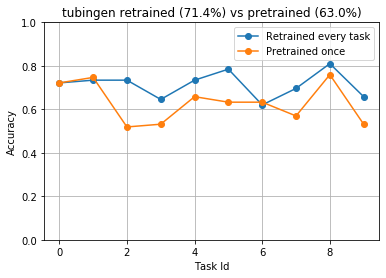

<Figure size 432x288 with 0 Axes>

In [7]:
for city in city_names:
    task_ids, retraining_acc = get_data(city, results_root, suffix="_retraining_result.json")
    plt.plot(task_ids, retraining_acc, label="Retrained every task", marker='o')
    
    task_ids, pretrained_acc = get_data(city, results_root, suffix="_pretrained_result.json")
    plt.plot(task_ids, pretrained_acc, label="Pretrained once", marker='o')
    plt.legend()
    plt.title("{} retrained ({:.1f}%) vs pretrained ({:.1f}%)".format(city, np.mean(retraining_acc)*100,
                                                                      np.mean(pretrained_acc)*100))
    plt.ylim([0,1])
    plt.xlabel('Task Id')
    plt.ylabel('Accuracy')
    #plt.savefig(os.path.join(result_dir, "{}_5tasks.png".format(city)))
    plt.grid()
    plt.figure()

## Comparing across task counts

In [6]:
# Original
result_roots = ['/home/romilb/research/msr/results/motivation/10tasks_10epochs/',
               #'/home/romilb/research/msr/results/motivation/5tasks/',
               '/home/romilb/research/msr/results/motivation/2tasks/']
               #'/home/romilb/research/msr/results/motivation/20tasks_50epochs/']
    
# Temp:
result_roots = ['/home/romilb/research/msr/results/motivation/0hw/20tasks/',
                '/home/romilb/research/msr/results/motivation/0hw/10tasks/',
               '/home/romilb/research/msr/results/motivation/0hw/2tasks/']
               #'/home/romilb/research/msr/results/motivation/20tasks_50epochs/']
    
pretrained_files = (glob.glob(result_roots[0] + "*_retraining_result.json"))
city_names = [os.path.basename(x).split('_retraining_result.json')[0] for x in pretrained_files]
print(result_roots[0])
print(city_names)

suffixes = ['_retraining_result.json', '_pretrained_result.json']

BASE_NUM_TASKS = 20

/home/romilb/research/msr/results/motivation/0hw/20tasks/
['krefeld', 'hanover', 'bochum', 'stuttgart', 'cologne', 'dusseldorf', 'hamburg', 'strasbourg', 'zurich', 'weimar', 'bremen', 'ulm', 'aachen', 'monchengladbach', 'jena', 'darmstadt', 'erfurt', 'tubingen']


<IPython.core.display.Javascript object>


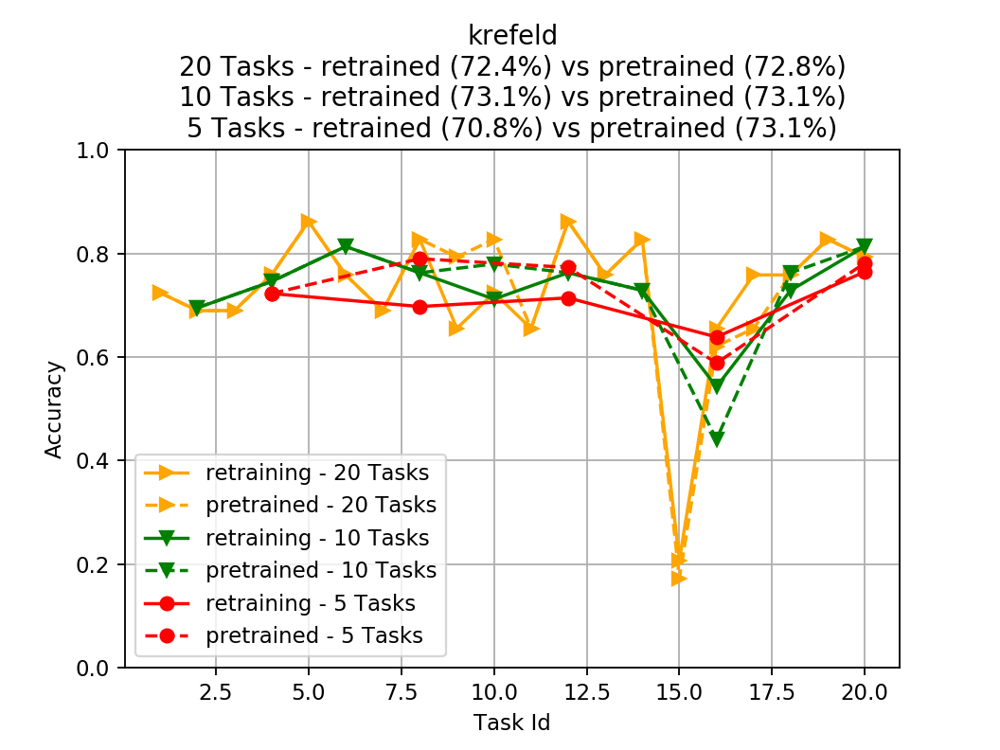

<IPython.core.display.Javascript object>


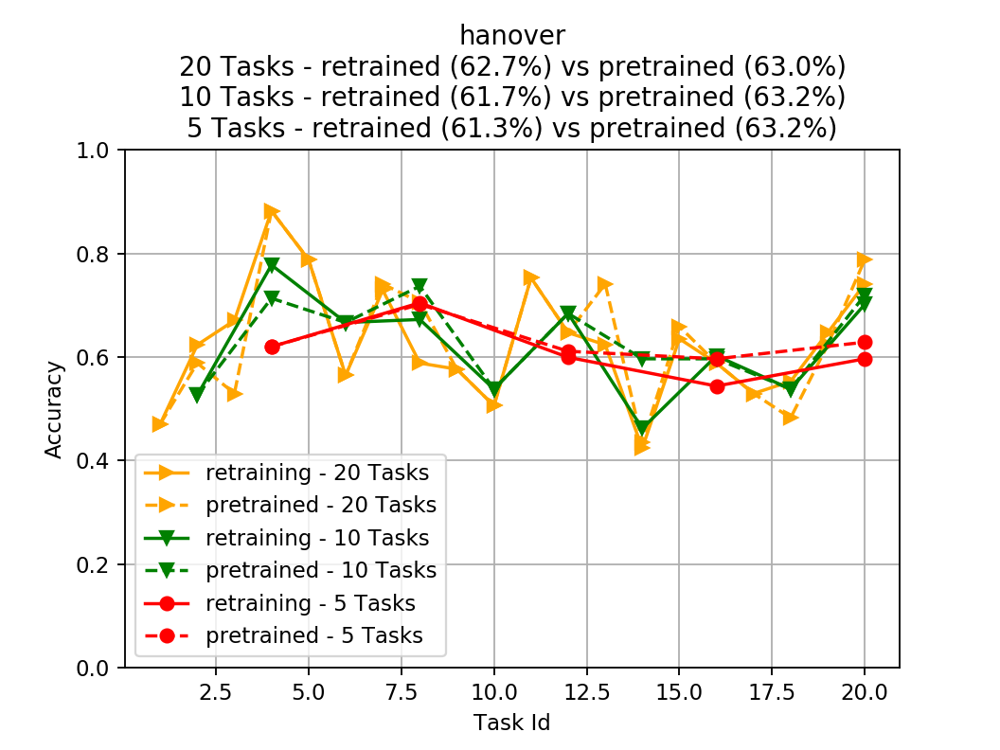

<IPython.core.display.Javascript object>


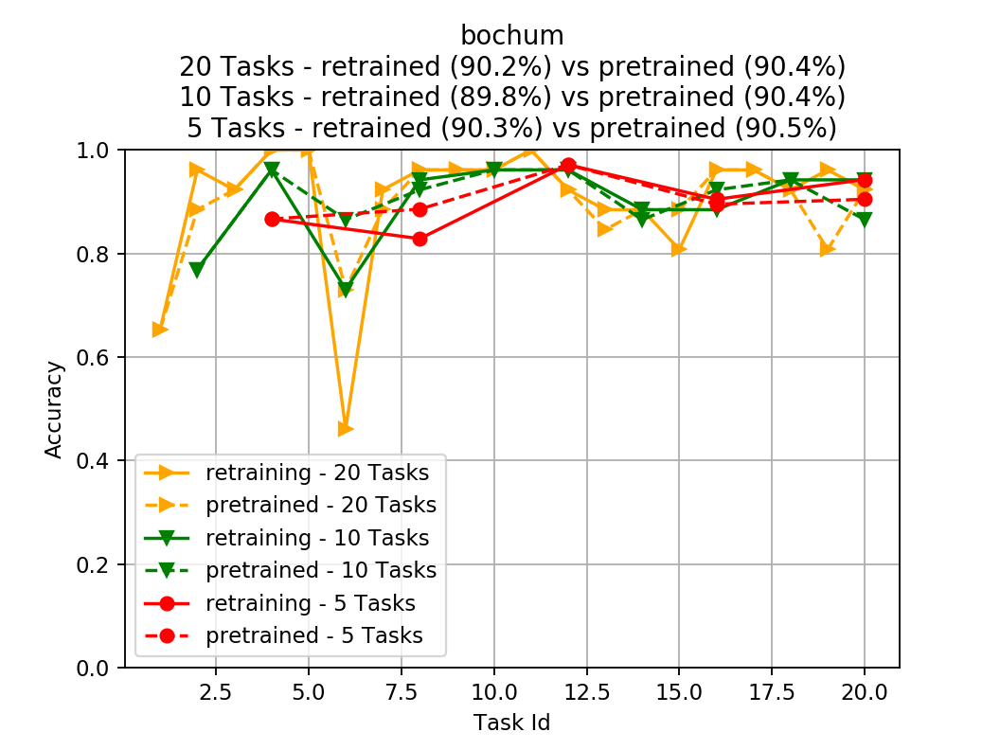

<IPython.core.display.Javascript object>


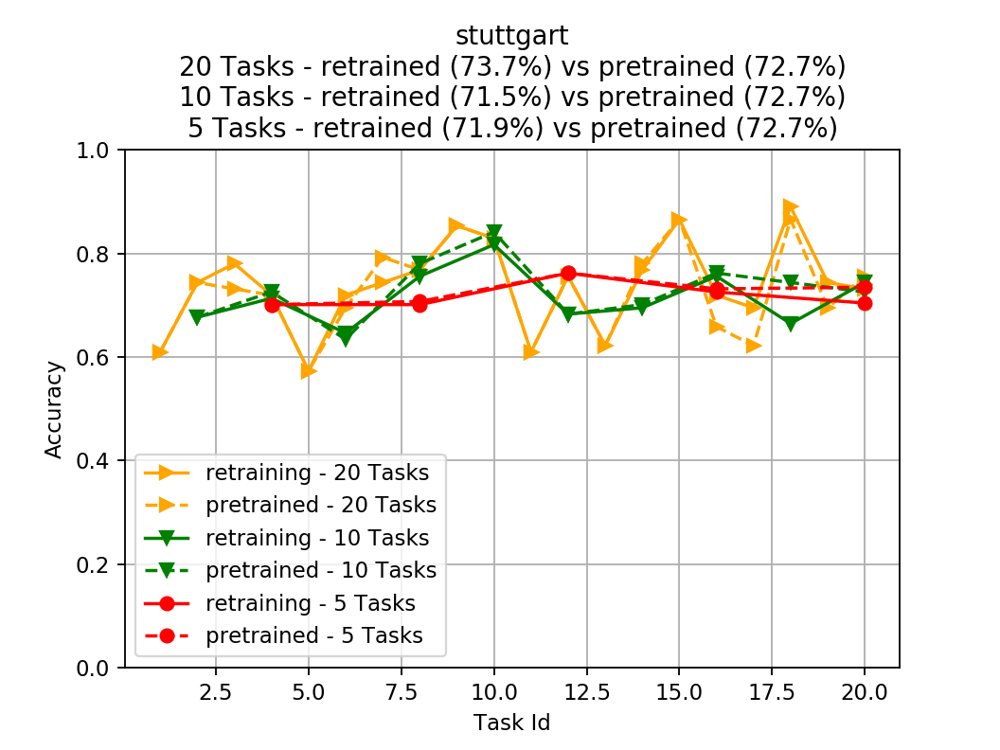

<IPython.core.display.Javascript object>


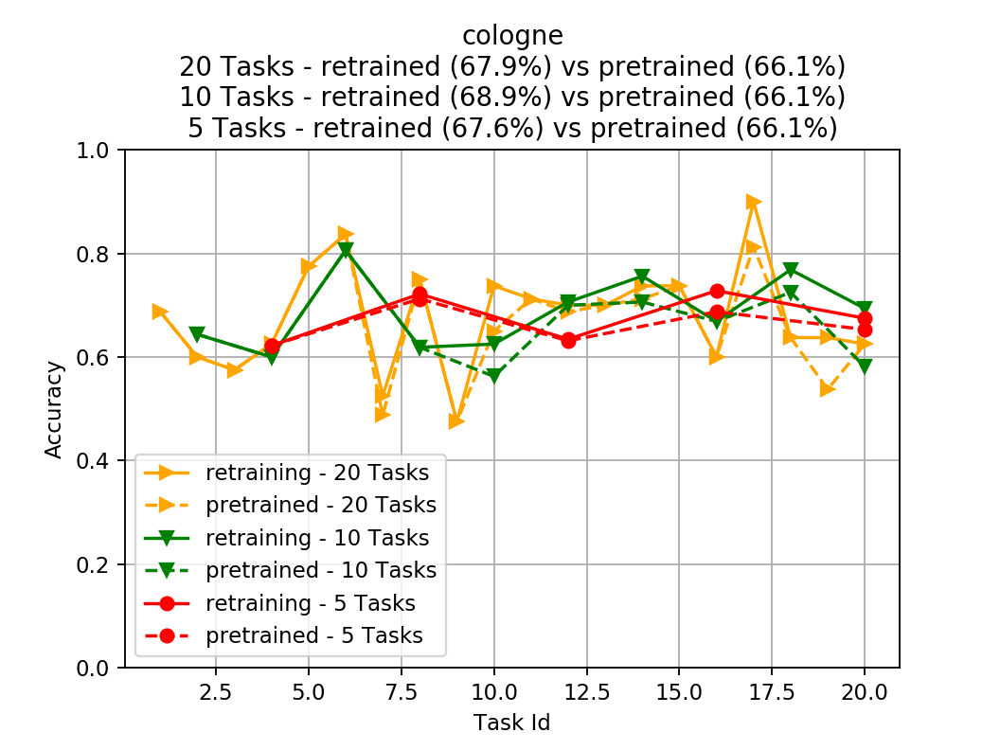

<IPython.core.display.Javascript object>


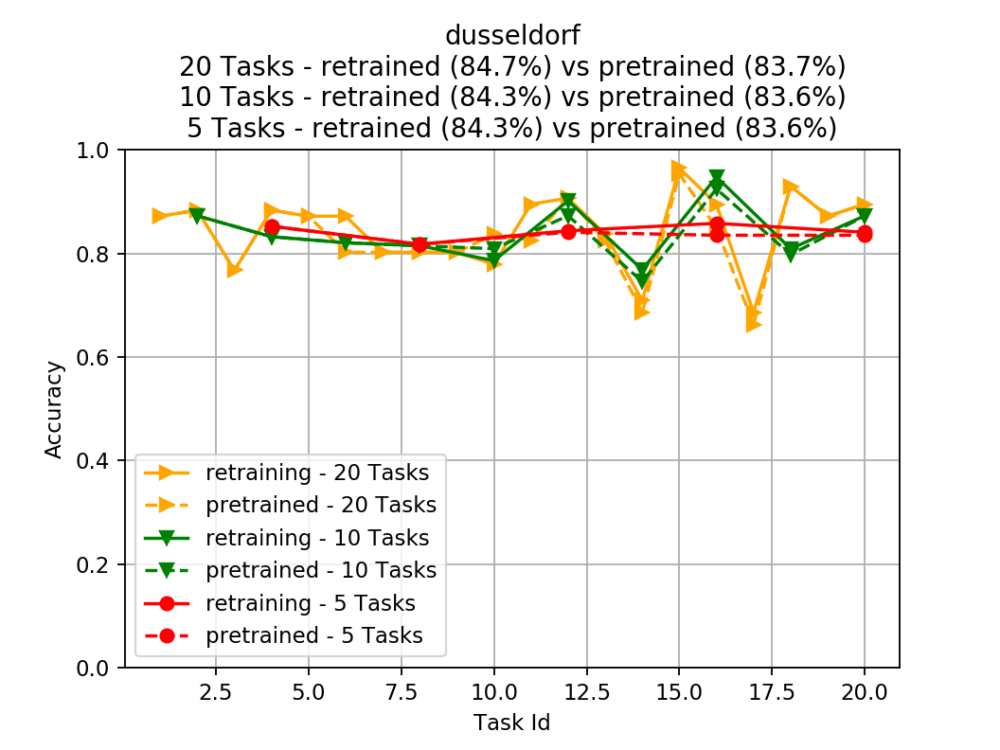

<IPython.core.display.Javascript object>


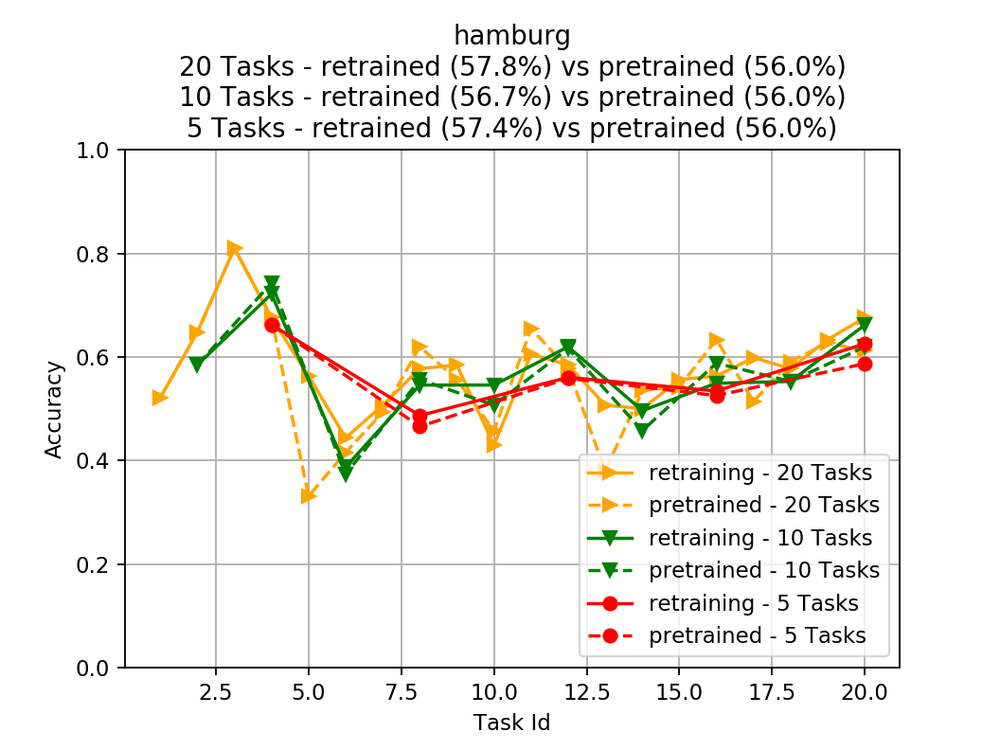

<IPython.core.display.Javascript object>


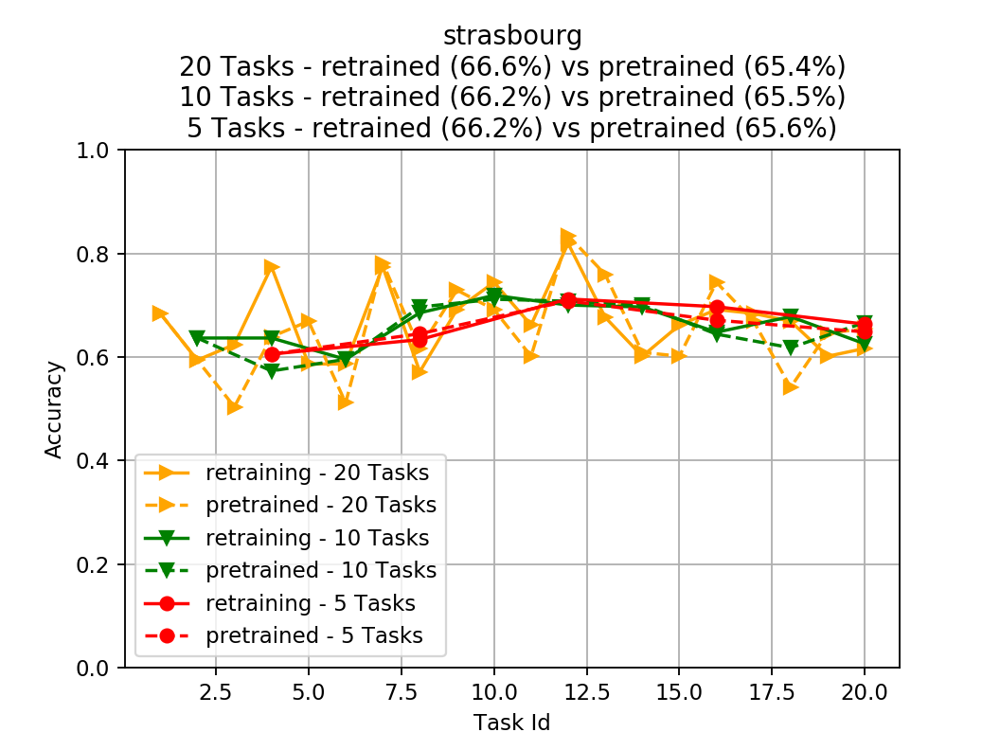

<IPython.core.display.Javascript object>


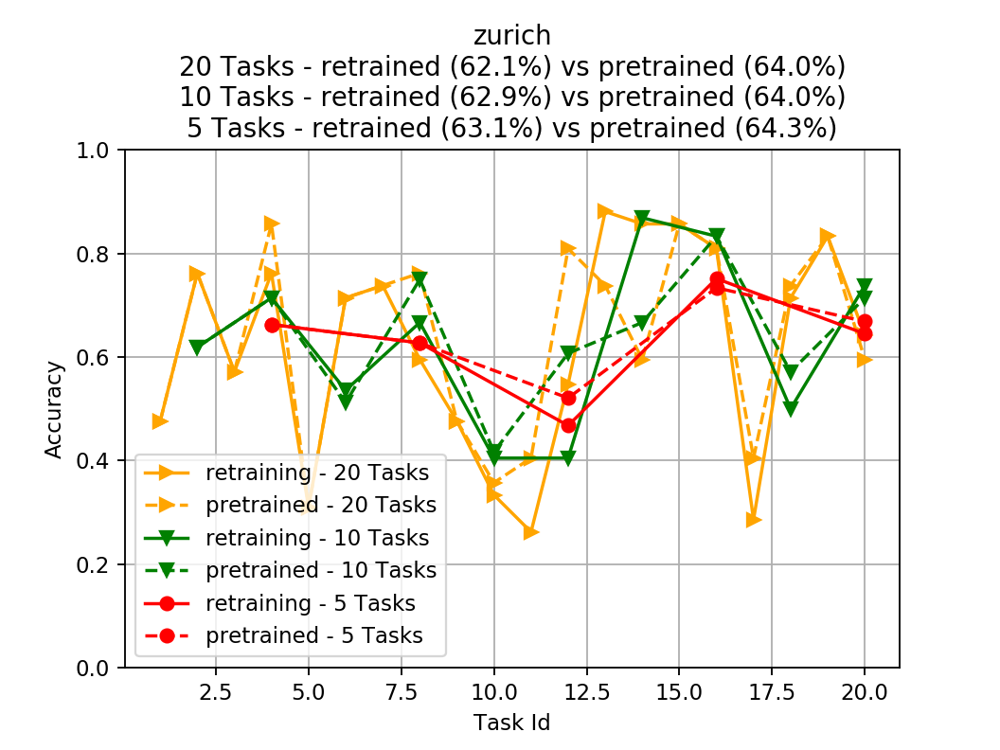

<IPython.core.display.Javascript object>


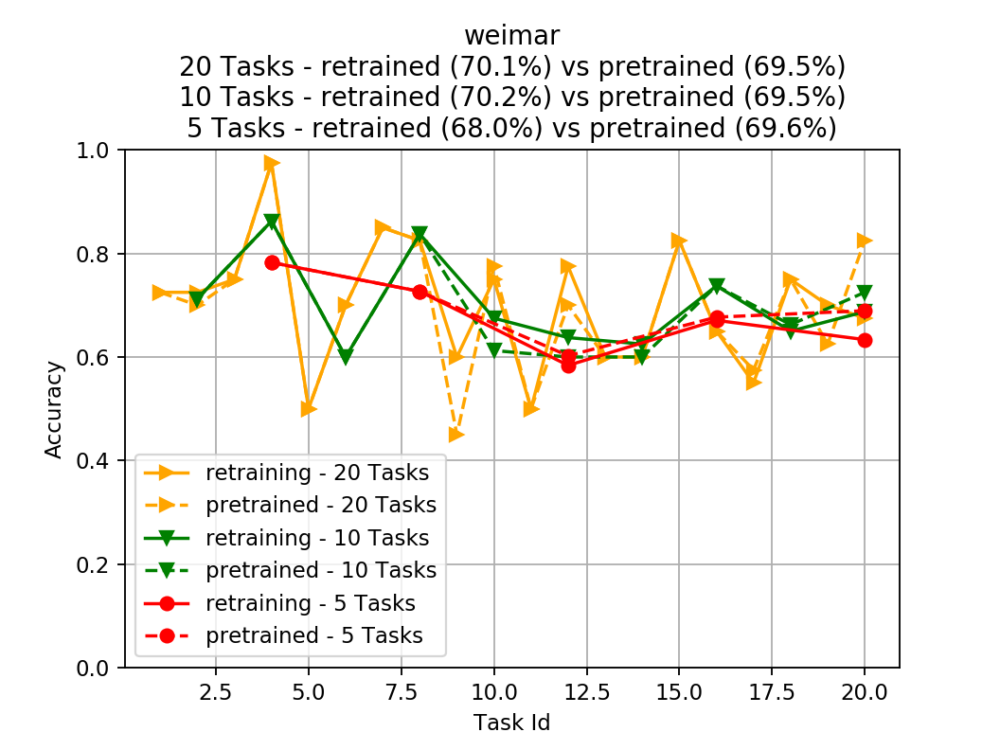

<IPython.core.display.Javascript object>


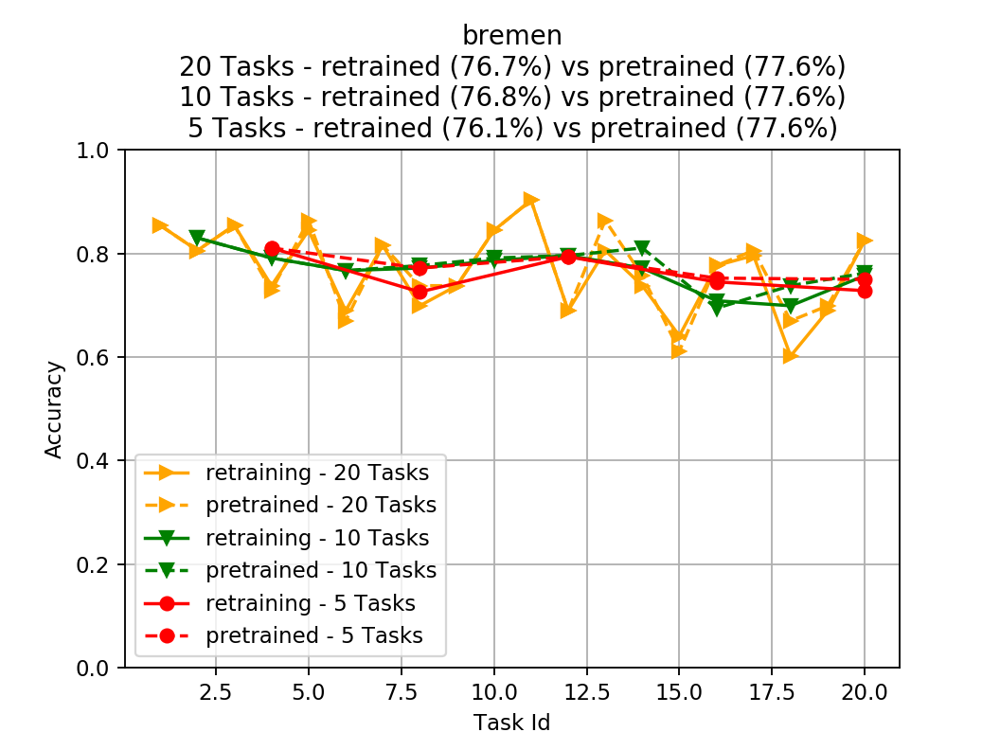

<IPython.core.display.Javascript object>


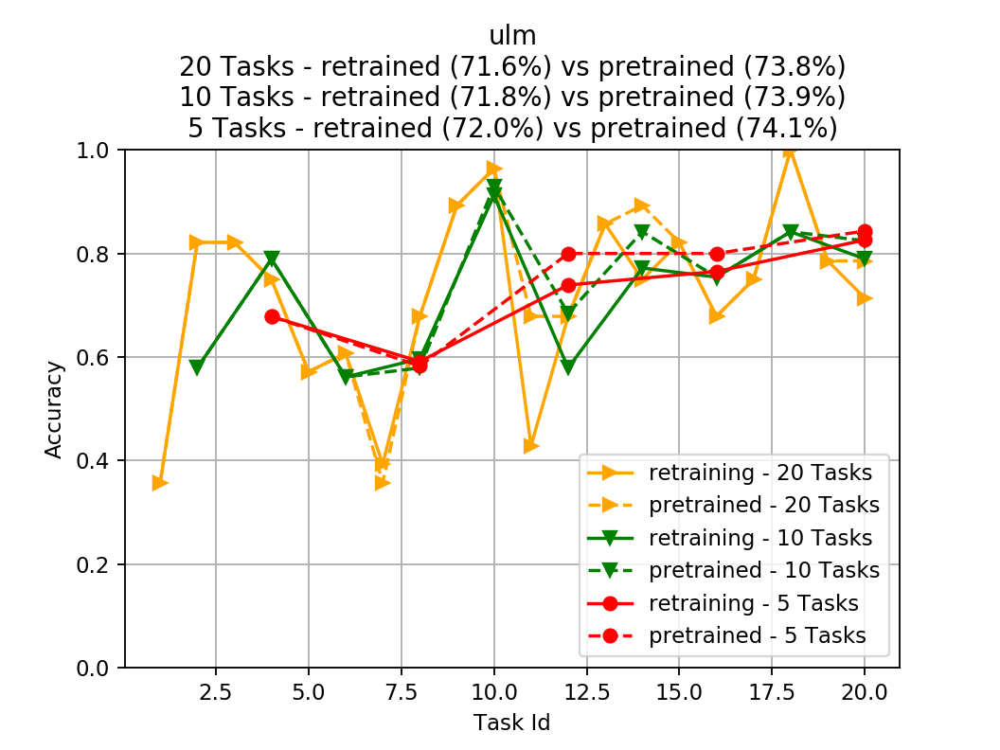

<IPython.core.display.Javascript object>


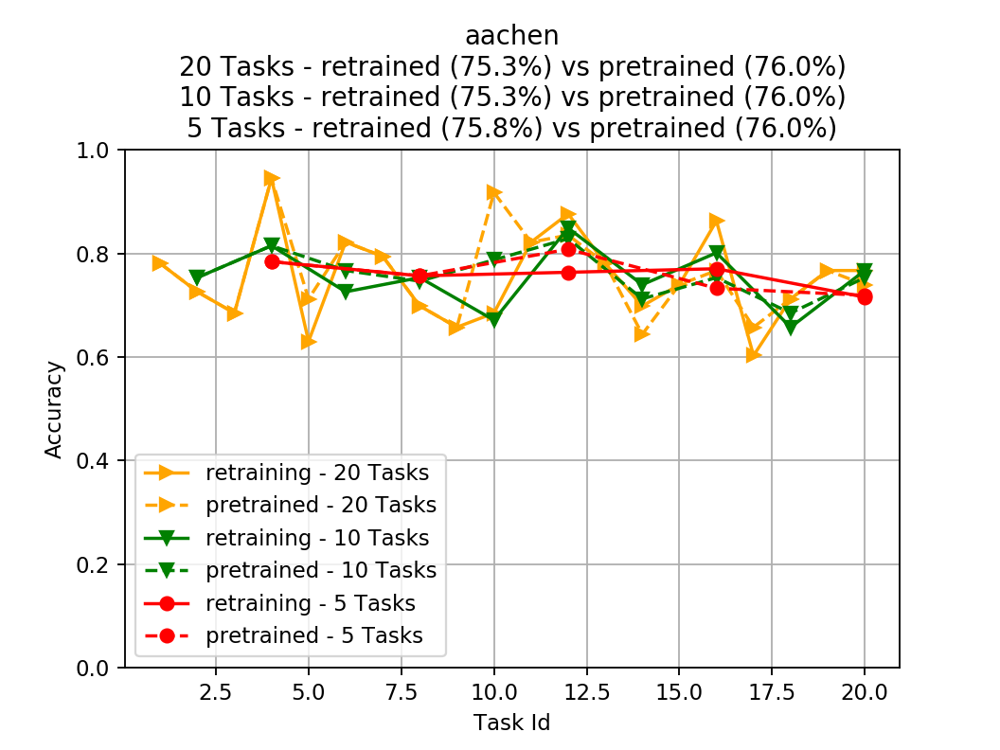

<IPython.core.display.Javascript object>


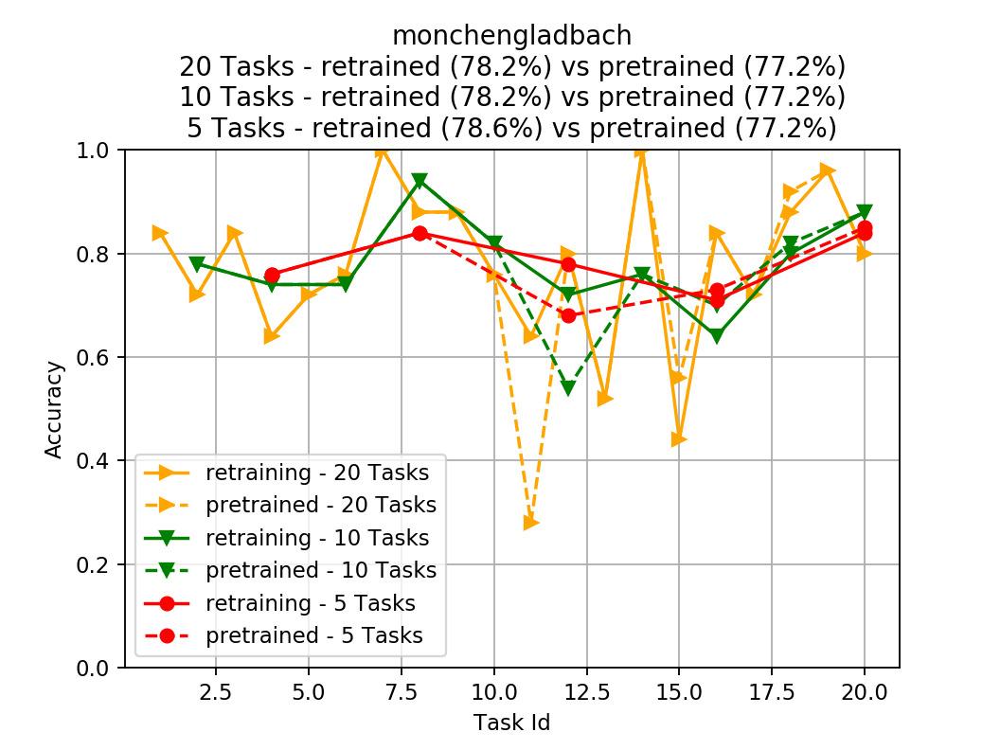

<IPython.core.display.Javascript object>


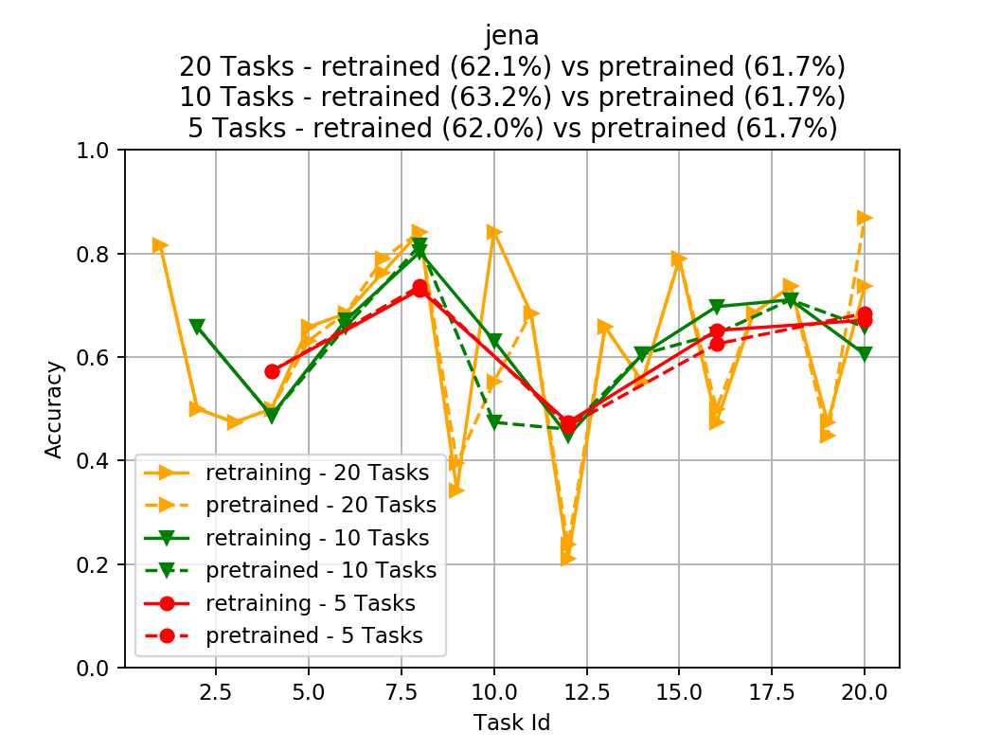

<IPython.core.display.Javascript object>


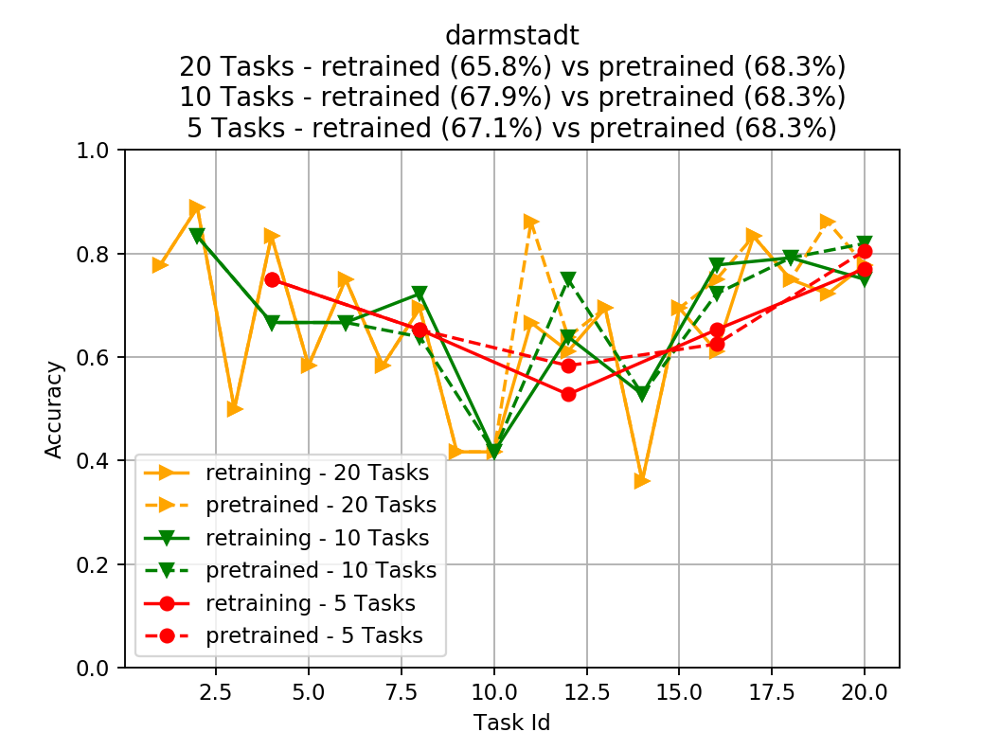

<IPython.core.display.Javascript object>


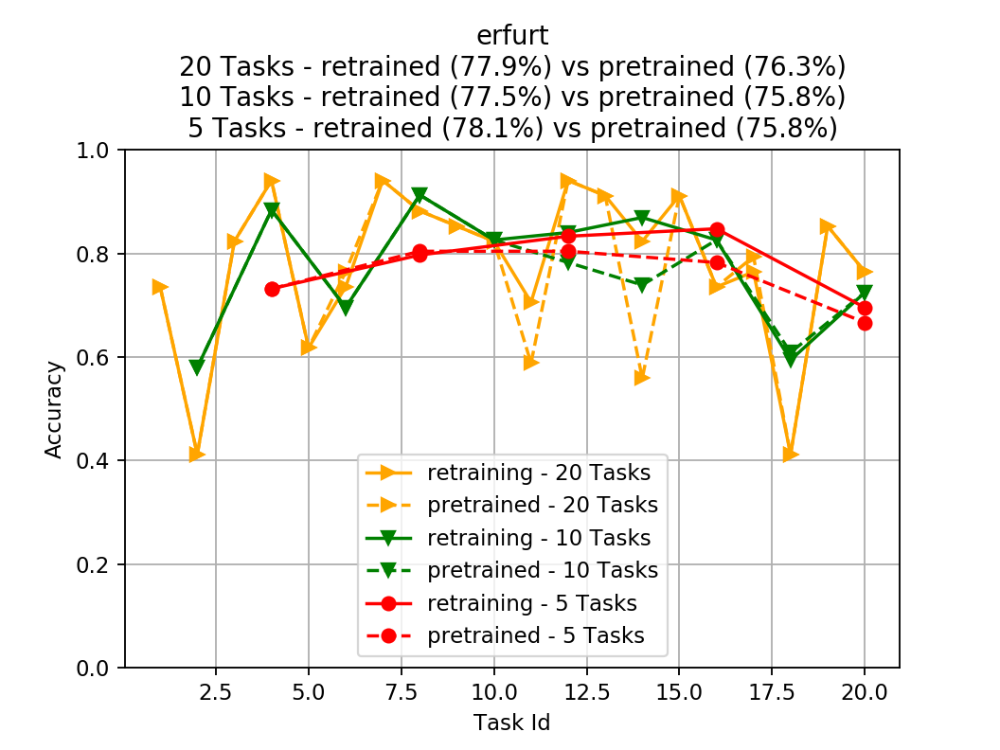

<IPython.core.display.Javascript object>


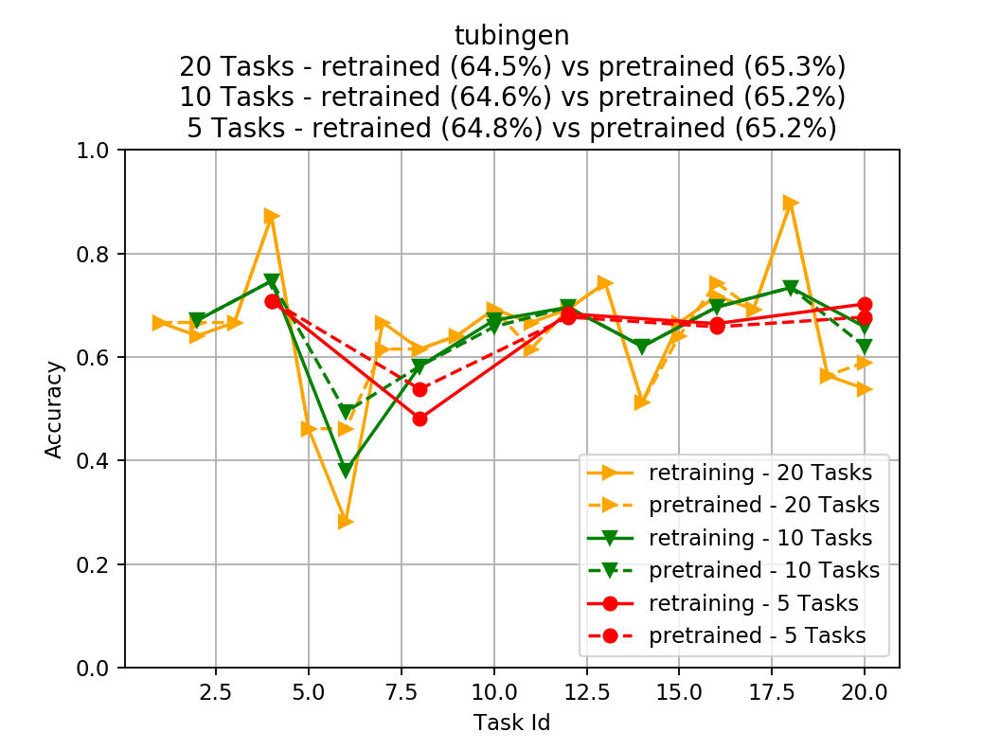

In [10]:
# def get_ls(num_tasks):
#     if num_tasks == 5:
#         return '--'
#     if num_tasks == 10:
#         return '-'
#     if num_tasks == 2:
#         return '-.'
#     else:
#         raise Exception

def get_ls(label_suffix):
    if label_suffix == 'retraining':
        return '-'
    if label_suffix == 'pretrained':
        return '--'
    else:
        raise Exception

def get_marker(num_tasks):
    if num_tasks == 5:
        return 'o'
    if num_tasks == 10:
        return 'v'
    if num_tasks == 20:
        return '>'
    if num_tasks == 2:
        return '^'
    else:
        raise Exception

        
def get_color(num_tasks):
    if num_tasks == 5:
        return 'r'
    if num_tasks == 10:
        return 'g'
    if num_tasks == 20:
        return 'orange'
    if num_tasks == 2:
        return 'b'
#     if label_suffix == 'retraining':
#         return 'r'
#     if label_suffix == 'pretrained':
#         return 'g'
    else:
        raise Exception
        
acc_dict = defaultdict(dict)
for city in city_names:
    fig=plt.figure()
    fig.tight_layout()
    plt.subplots_adjust(top=0.8)
    title_text = ""
    for res_root in result_roots:
        for suffix in suffixes:
            task_ids, acc = get_data(city, res_root, suffix=suffix)
            num_tasks = len(task_ids)
            interpolated_taskids = [(x+1)*int(BASE_NUM_TASKS/num_tasks) for x in task_ids]
            
            marker = get_marker(num_tasks)
            label_suffix = 'retraining' if suffix == '_retraining_result.json' else 'pretrained'
            color = get_color(num_tasks)
            linestyle = get_ls(label_suffix)
            plt.plot(interpolated_taskids, acc, marker=marker, ls=linestyle, color=color,
                     label="{} - {} Tasks".format(label_suffix, str(num_tasks)))
            if label_suffix == 'retraining':
                retraining_acc = acc
                acc_dict[city][num_tasks] = (interpolated_taskids, acc)
            elif label_suffix == 'pretrained':
                pretrained_acc = acc
                #acc_dict[city]['pretrained'] = (task_ids, acc)
        title_text += "\n{} Tasks - retrained ({:.1f}%) vs pretrained ({:.1f}%)".format(num_tasks,
                                                                                        np.mean(retraining_acc)*100,
                                                                                        np.mean(pretrained_acc)*100)
            
    plt.legend()
    plt.title("{}{}".format(city, title_text))
    plt.ylim([0,1])
    plt.xlabel('Task Id')
    plt.ylabel('Accuracy')
    plt.savefig(os.path.join('/home/romilb/research/msr/results/motivation/0hw/plots', "{}.png".format(city)))
    plt.grid()

/home/romilb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


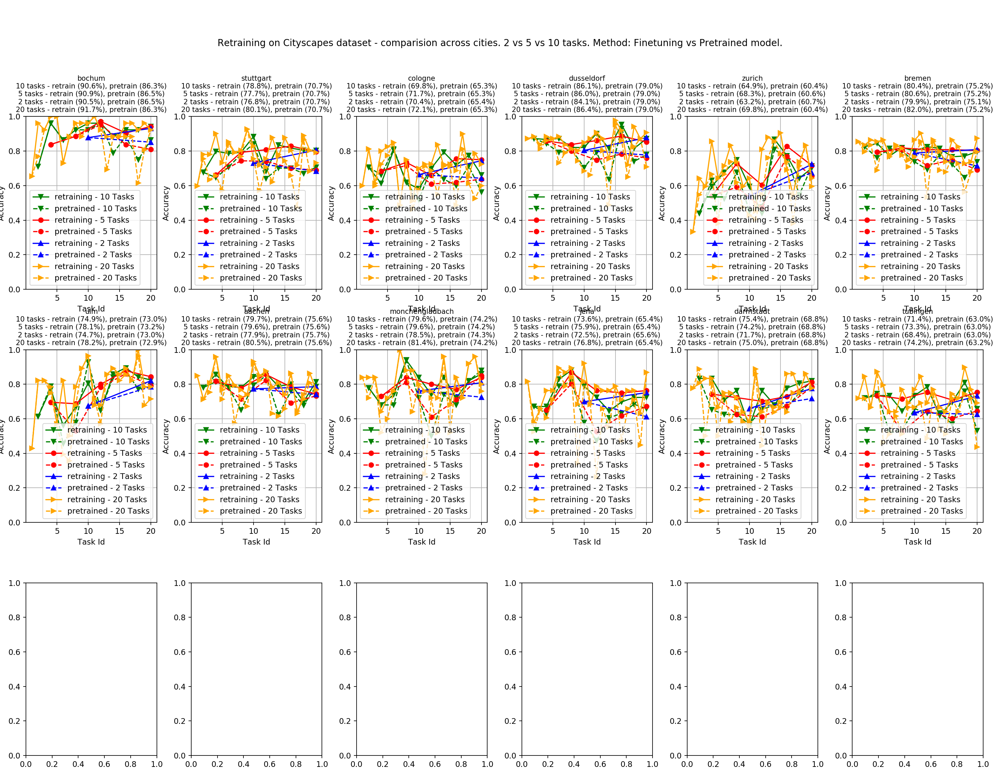

/home/romilb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


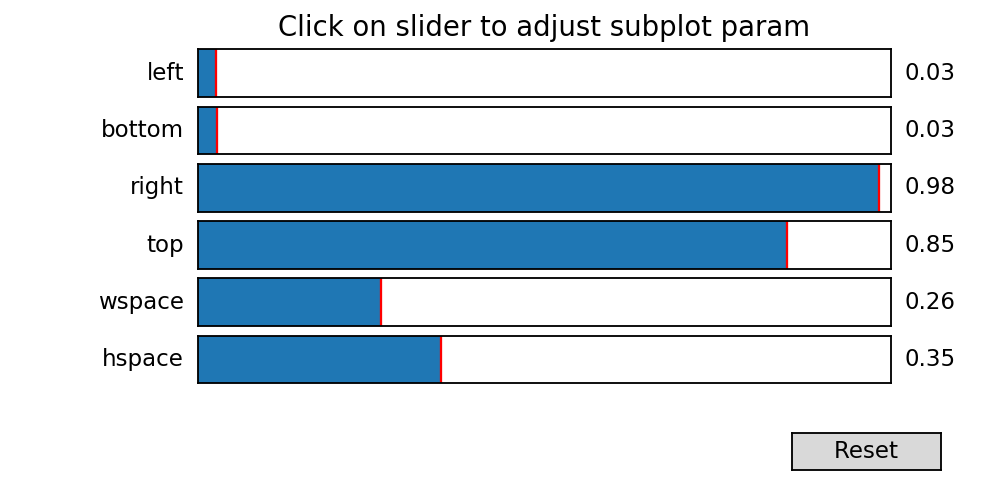

In [27]:
# Plot in a grid
acc_dict = defaultdict(dict)
f, axes = plt.subplots(3, 6, figsize=(18,14))
plt.tight_layout()
plt.subplots_adjust(hspace=0.35)
for i, city in enumerate(city_names):
    ax=f.axes[i]
    title_text = ""
    for res_root in result_roots:
        for suffix in suffixes:
            task_ids, acc = get_data(city, res_root, suffix=suffix)
            num_tasks = len(task_ids)
            interpolated_taskids = [(x+1)*int(BASE_NUM_TASKS/num_tasks) for x in task_ids]
            
            marker = get_marker(num_tasks)
            label_suffix = 'retraining' if suffix == '_retraining_result.json' else 'pretrained'
            color = get_color(num_tasks)
            linestyle = get_ls(label_suffix)
            ax.plot(interpolated_taskids, acc, marker=marker, ls=linestyle, color=color,
                     label="{} - {} Tasks".format(label_suffix, str(num_tasks)))
            if label_suffix == 'retraining':
                retraining_acc = acc
                acc_dict[city][num_tasks] = (interpolated_taskids, acc)
            elif label_suffix == 'pretrained':
                pretrained_acc = acc
                #acc_dict[city]['pretrained'] = (task_ids, acc)
        title_text += "\n{} tasks - retrain ({:.1f}%), pretrain ({:.1f}%)".format(num_tasks,
                                                                                        np.mean(retraining_acc)*100,
                                                                                        np.mean(pretrained_acc)*100)
            
    ax.legend()
    ax.set_title("{}{}".format(city, title_text), fontdict = {'fontsize' : 9})
    ax.set_ylim([0,1])
    ax.set_xlabel('Task Id')
    ax.set_ylabel('Accuracy')
    #plt.savefig(os.path.join('/home/romilb/research/msr/results/motivation/combined_2_5_10', "{}.png".format(city)))
    ax.grid()
    
fig = plt.gcf()
st = fig.suptitle("Retraining on Cityscapes dataset - comparision across cities. 2 vs 5 vs 10 tasks. Method: Finetuning vs Pretrained model.")
st.set_y(0.95)
fig.subplots_adjust(top=0.85)
#plt.savefig(os.path.join('/home/romilb/research/msr/results/motivation/combined_2_5_10', "multiplot.pdf"))
plt.subplot_tool()

## Notes:
* Notes even though 2 tasks gives lower accuracy than pretrained, also note that 10 tasks uses 5x more resources, because each retraining runs for 50 epochs.  

In [16]:
acc_dict

defaultdict(dict,
            {'krefeld': {10: ([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
               (0.6779661016949152,
                0.7966101694915254,
                0.8305084745762712,
                0.8305084745762712,
                0.7796610169491526,
                0.847457627118644,
                0.711864406779661,
                0.8305084745762712,
                0.7796610169491526,
                0.7966101694915254)),
              5: ([0, 1, 2, 3, 4],
               (0.6722689075630252,
                0.8319327731092436,
                0.8151260504201681,
                0.8151260504201681,
                0.7731092436974789)),
              2: ([0, 1], (0.725752508361204, 0.8093645484949833))},
             'hanover': {10: ([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
               (0.4619883040935672,
                0.783625730994152,
                0.7777777777777777,
                0.7368421052631579,
                0.7426900584795322,
                0.736842105263157

/home/romilb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


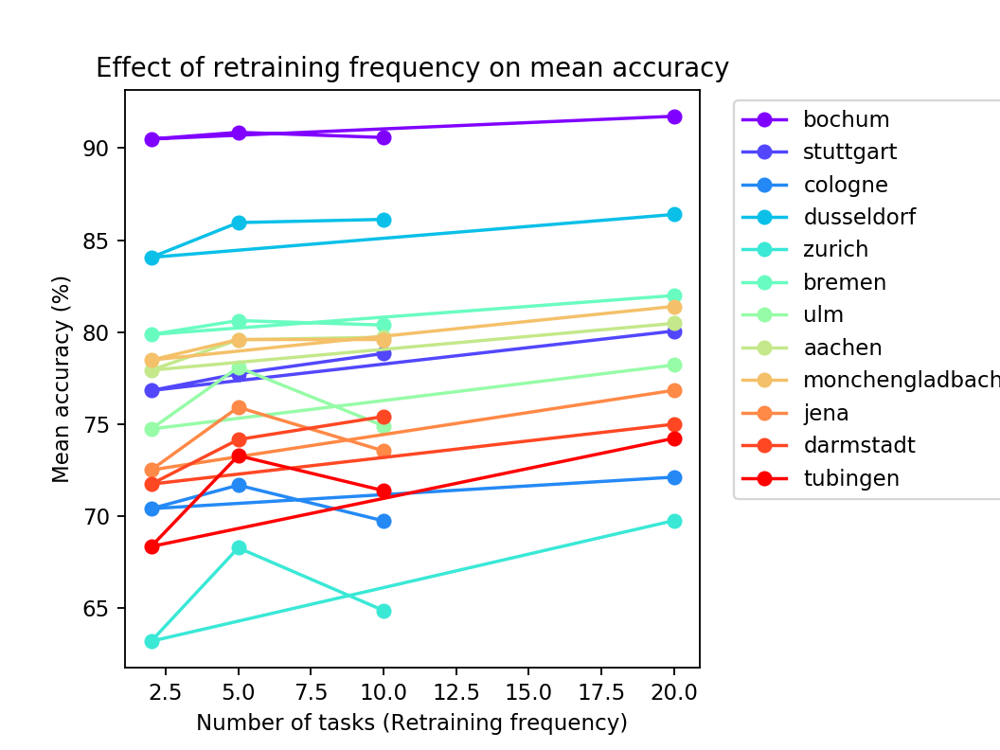

In [28]:
colors = iter(plt.cm.rainbow(np.linspace(0,1,len(acc_dict))))
plt.figure()
avg_compute = defaultdict(list)
for city, taskdict in acc_dict.items():
    x = []
    y = []
    for num_tasks, (taskids, acc) in taskdict.items():
        x.append(num_tasks)
        y.append(np.mean(acc)*100)
        avg_compute[num_tasks].append(np.mean(acc)*100)
    plt.plot(x,y, label=city, marker='o', color=next(colors))
plt.show()
plt.xlabel('Number of tasks (Retraining frequency)')
plt.ylabel('Mean accuracy (%)')
plt.title("Effect of retraining frequency on mean accuracy")
#plt.ylim([40,100])
plt.subplots_adjust(right=0.7)
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
#plt.savefig(os.path.join('/home/romilb/research/msr/results/motivation/combined_2_5_10', "frequency_vs_acc.pdf"))


# Compare 10 epochs vs 50 epochs for 10 tasks.
This is to ensure resource usage parity between 2 tasks and 10 tasks

['krefeld', 'hanover', 'bochum', 'stuttgart', 'cologne', 'dusseldorf', 'hamburg', 'strasbourg', 'zurich', 'weimar', 'bremen', 'ulm', 'aachen', 'monchengladbach', 'jena', 'darmstadt', 'erfurt', 'tubingen']


/home/romilb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


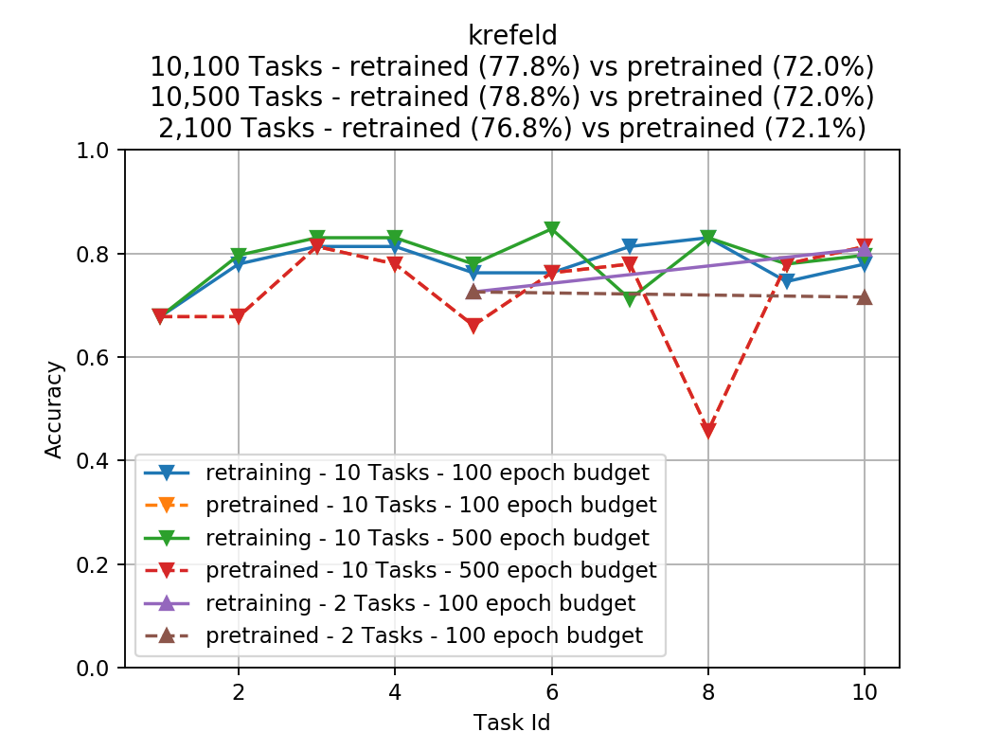

<IPython.core.display.Javascript object>


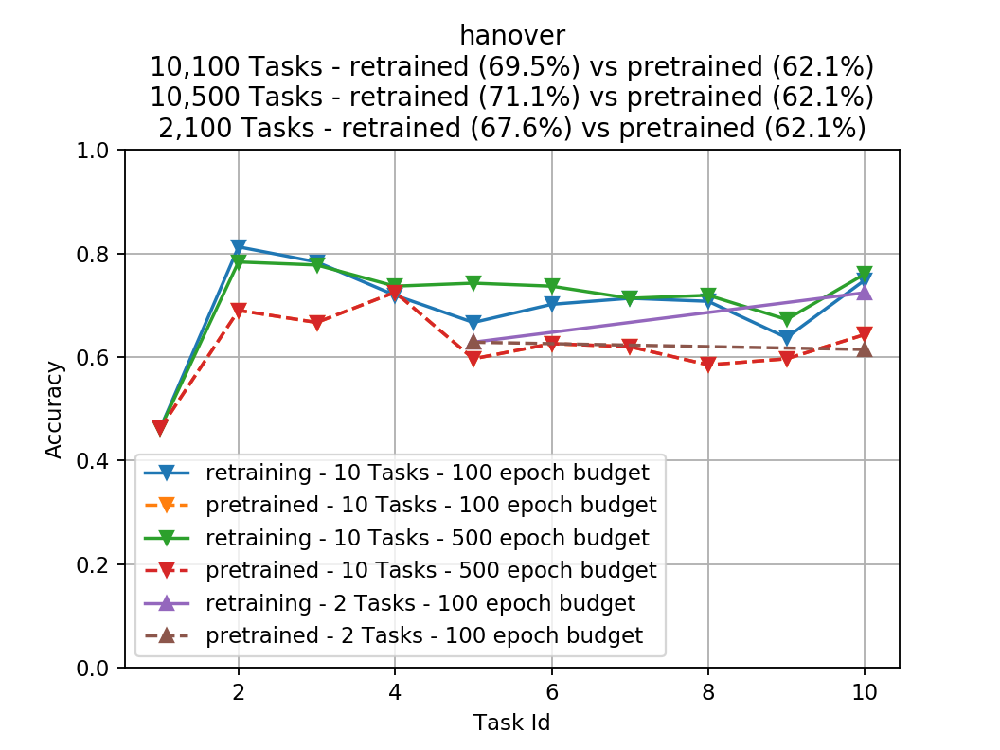

<IPython.core.display.Javascript object>


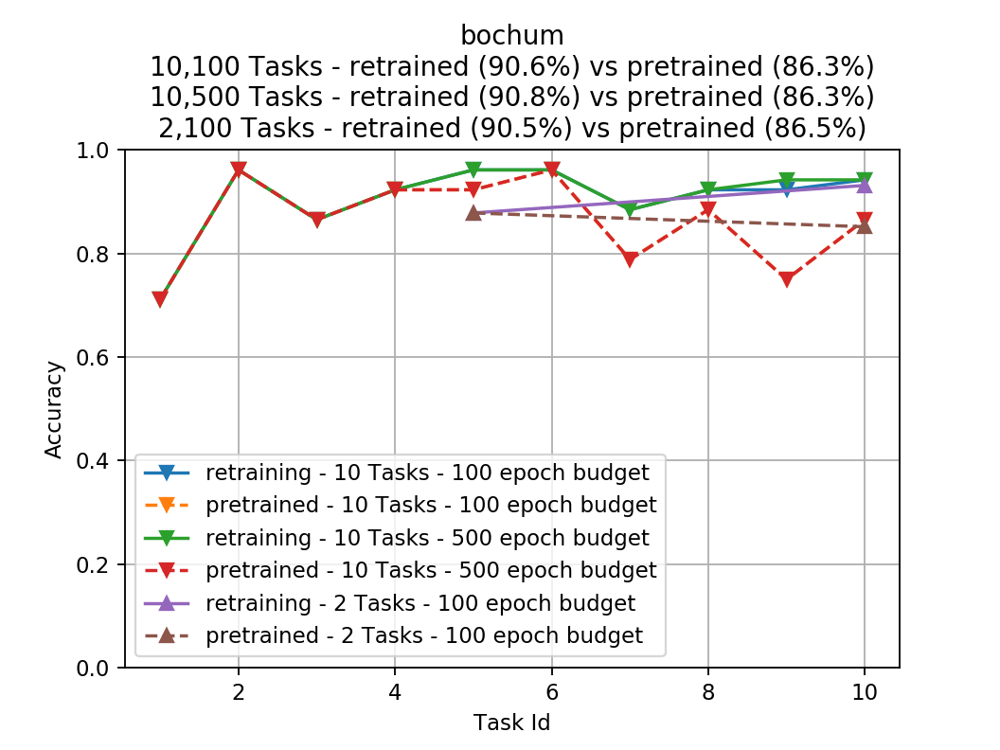

<IPython.core.display.Javascript object>


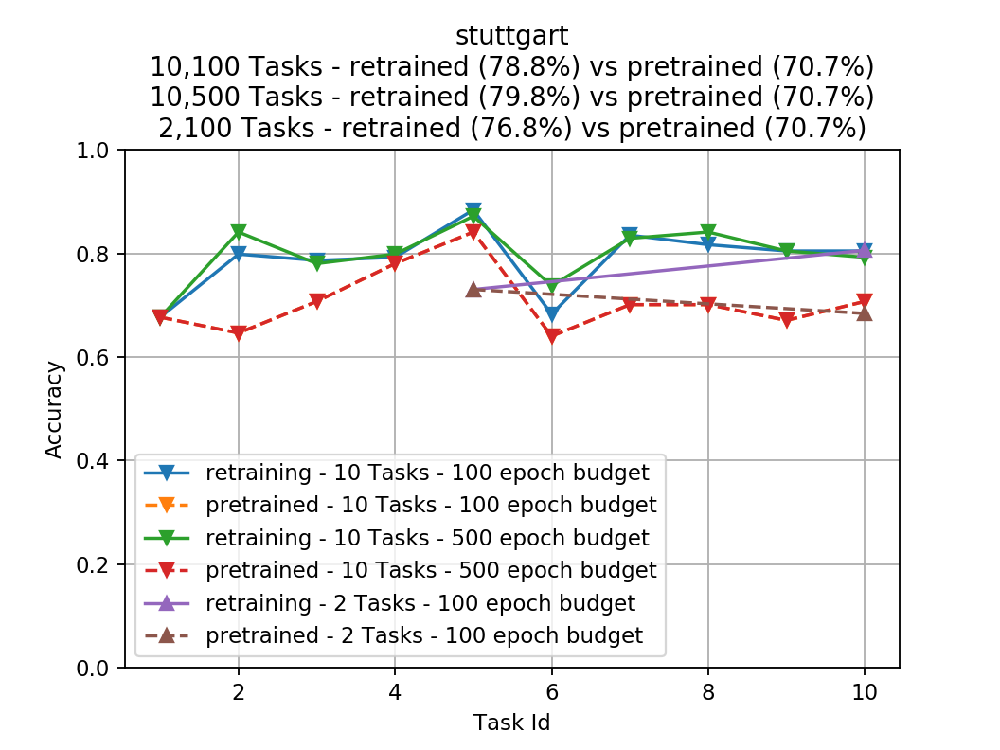

<IPython.core.display.Javascript object>


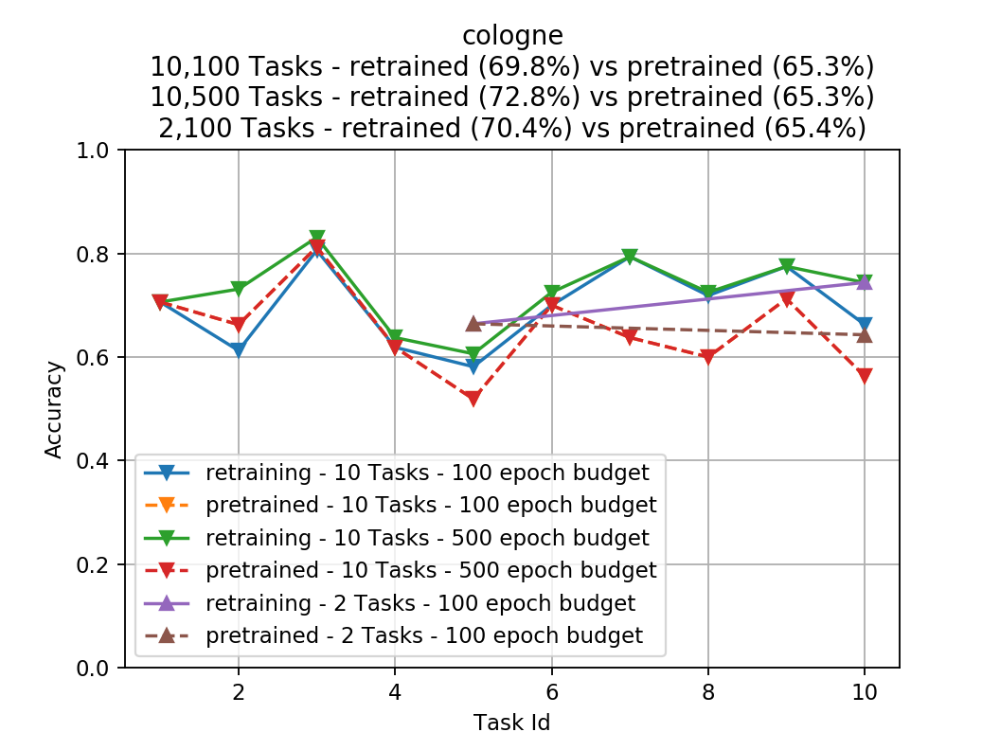

<IPython.core.display.Javascript object>


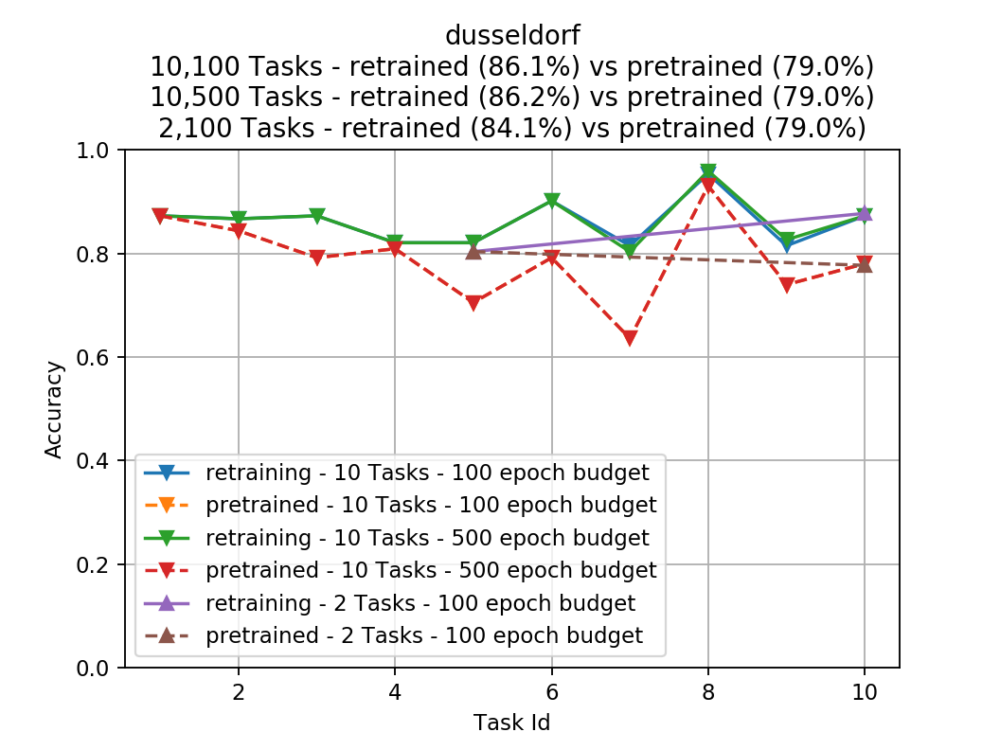

<IPython.core.display.Javascript object>


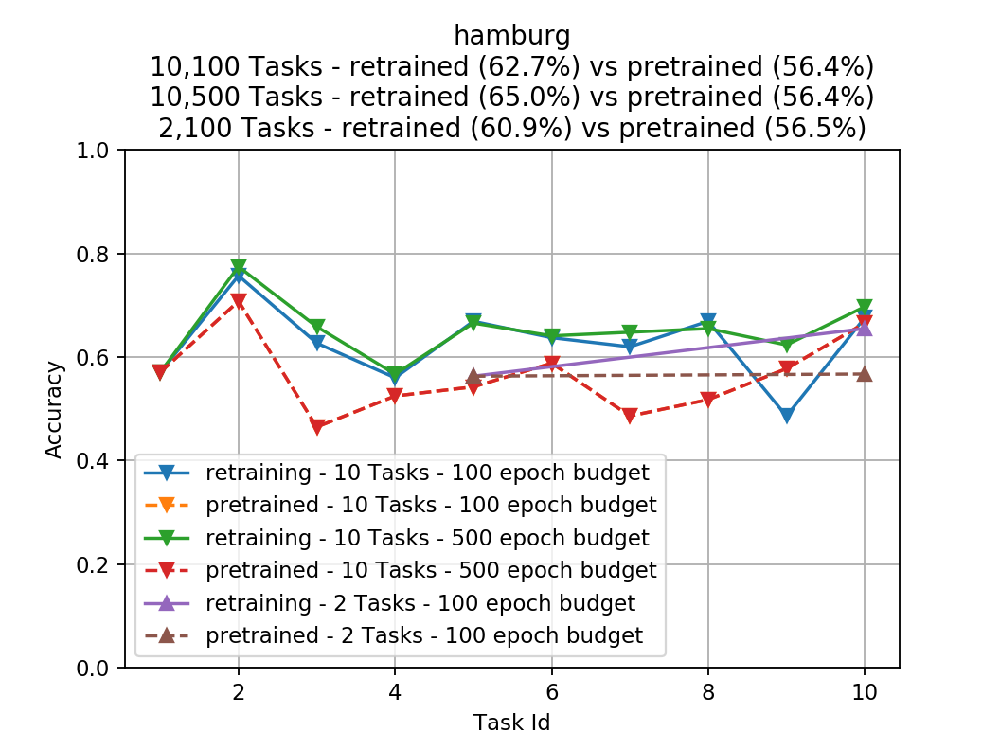

<IPython.core.display.Javascript object>


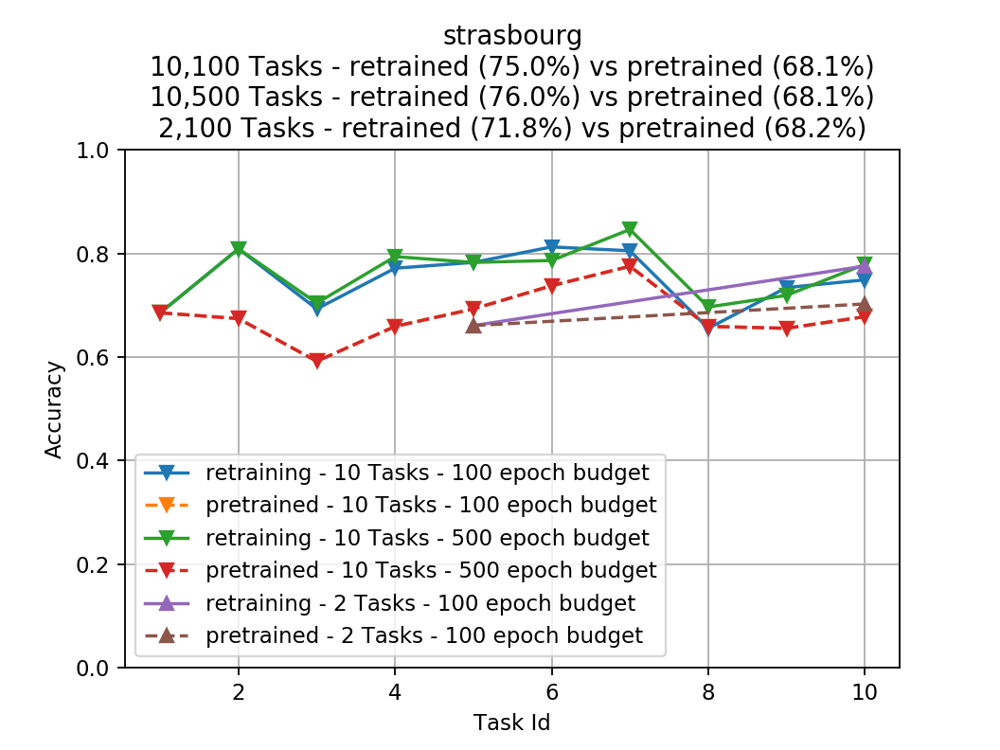

<IPython.core.display.Javascript object>


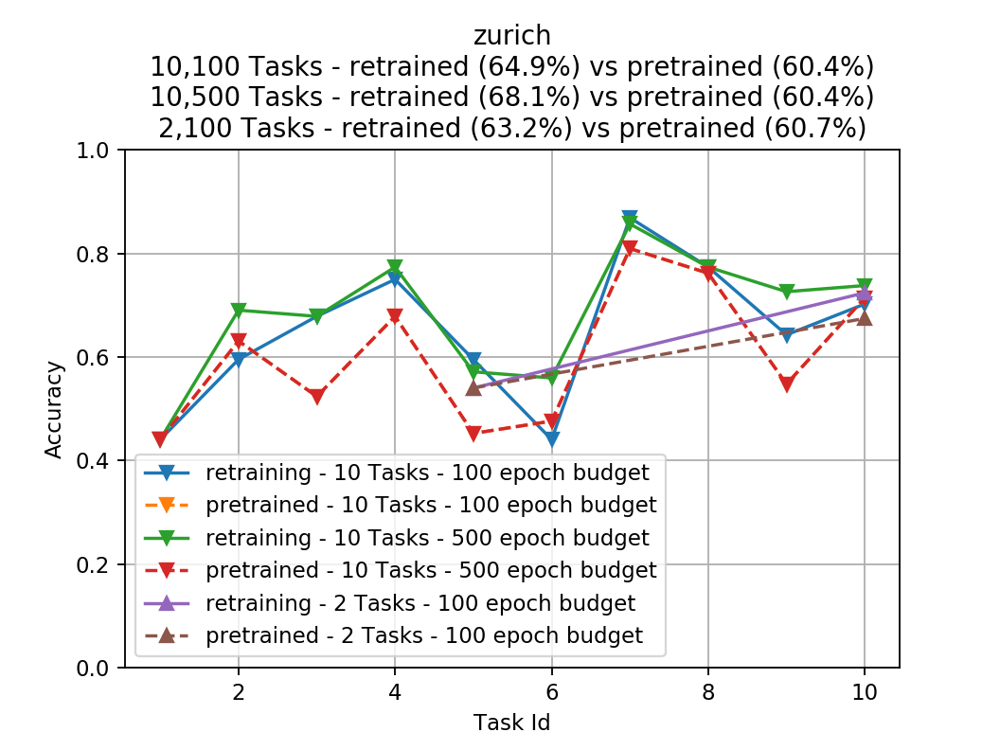

<IPython.core.display.Javascript object>


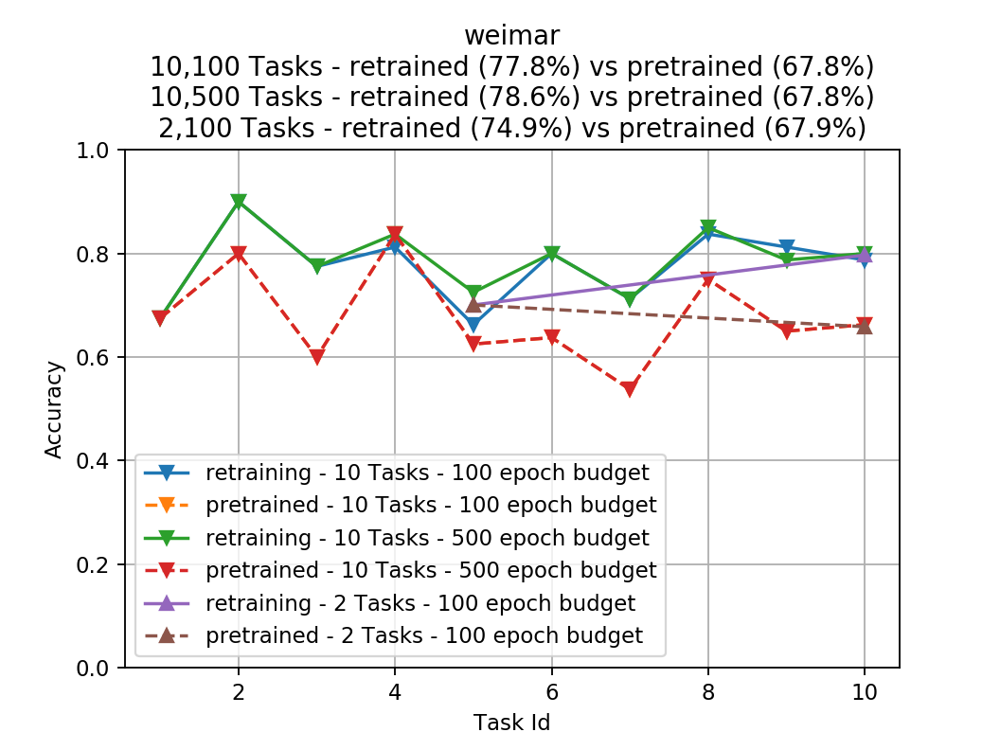

<IPython.core.display.Javascript object>


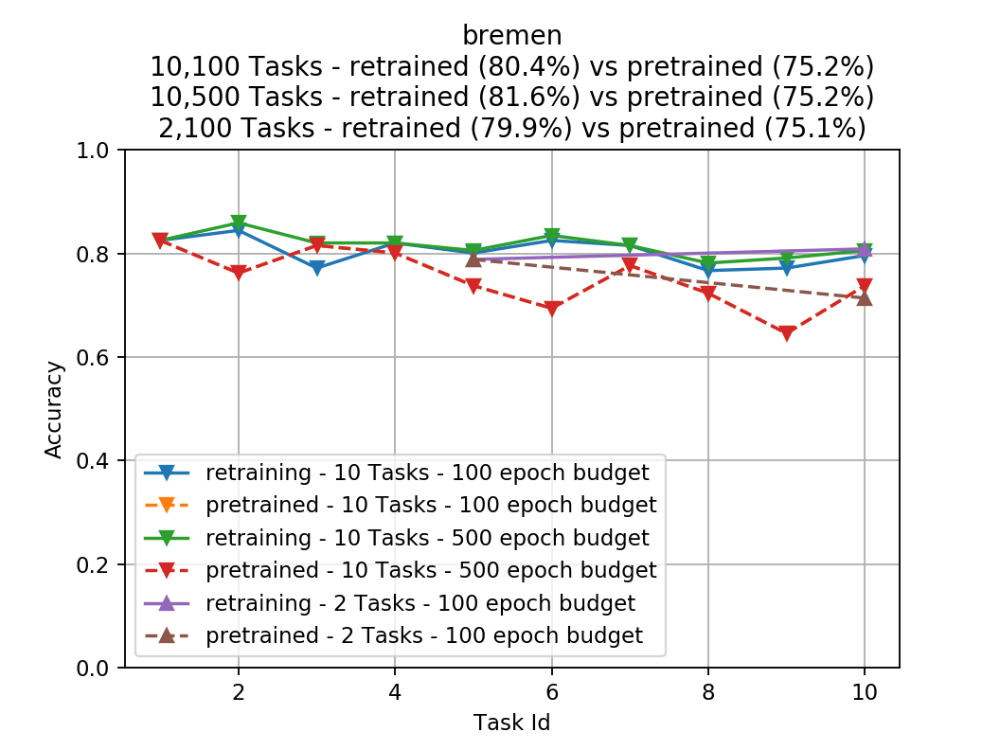

<IPython.core.display.Javascript object>


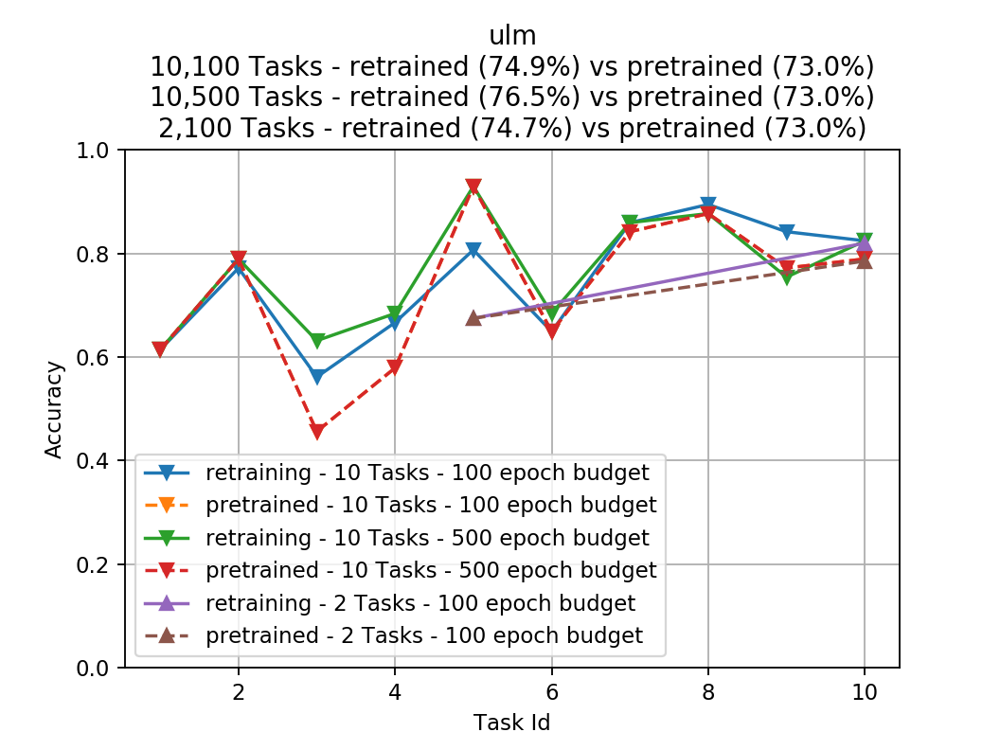

<IPython.core.display.Javascript object>


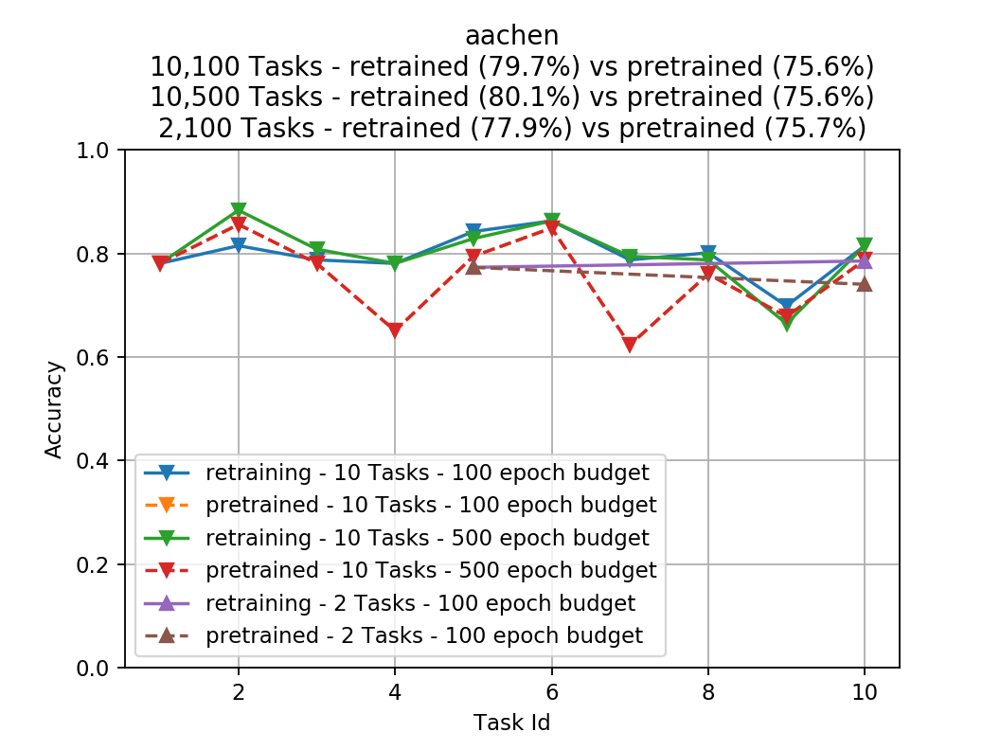

<IPython.core.display.Javascript object>


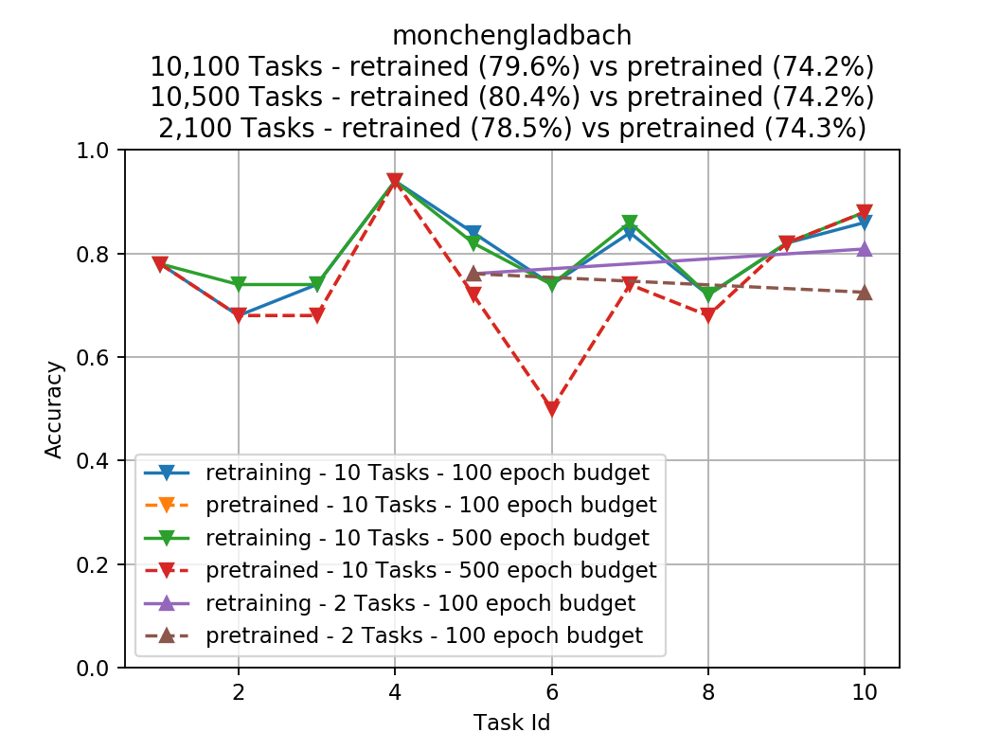

<IPython.core.display.Javascript object>


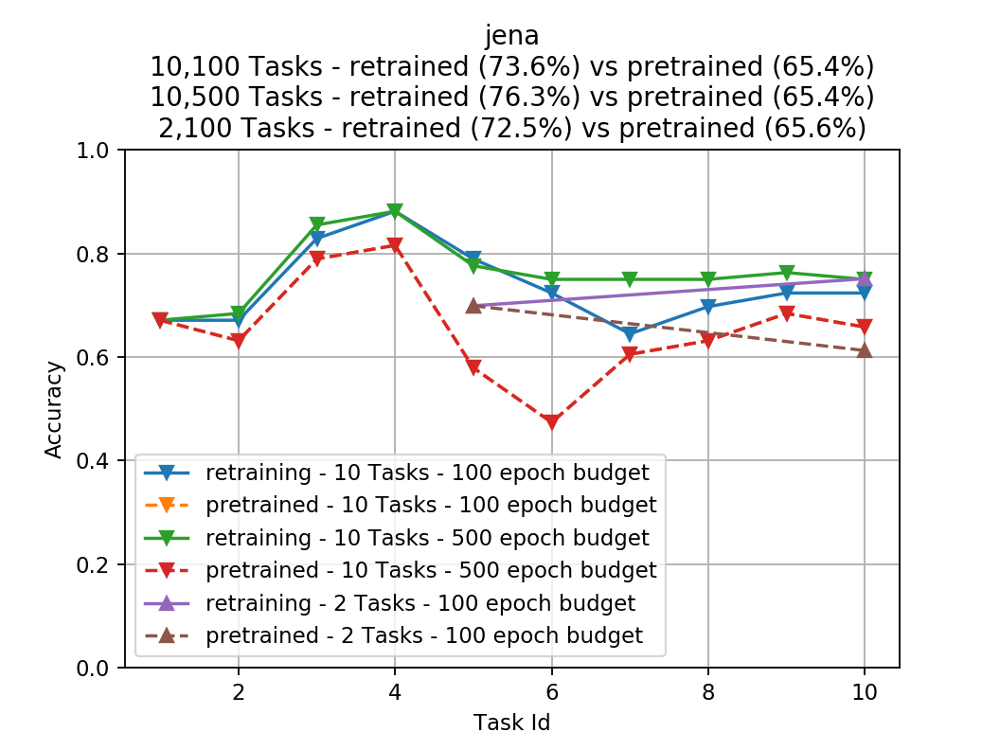

<IPython.core.display.Javascript object>


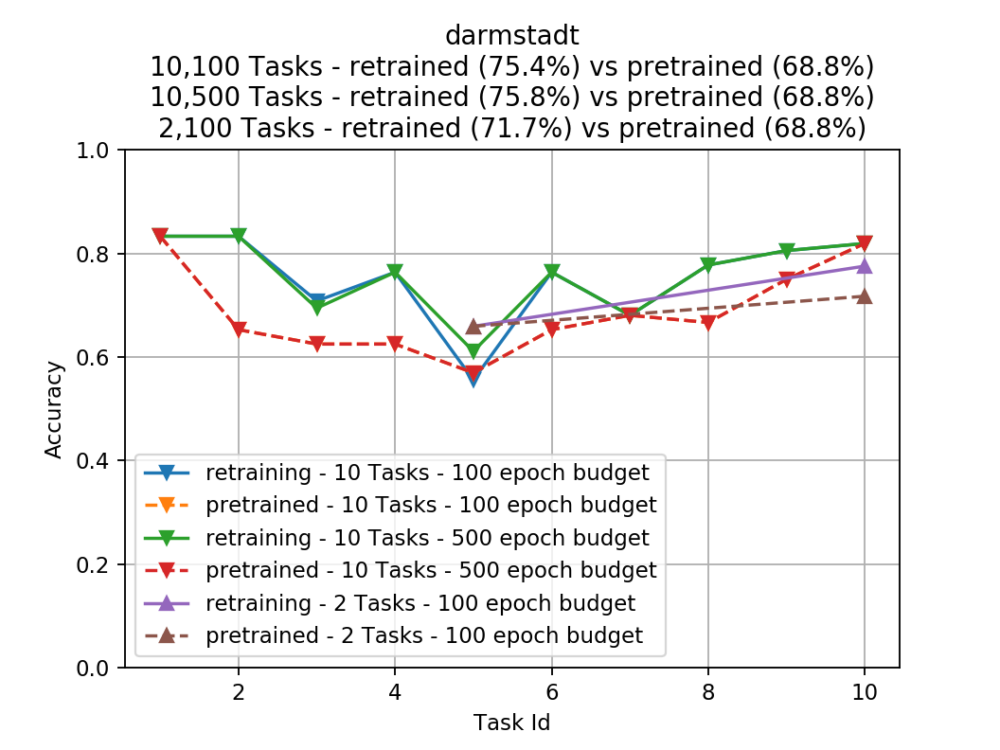

<IPython.core.display.Javascript object>


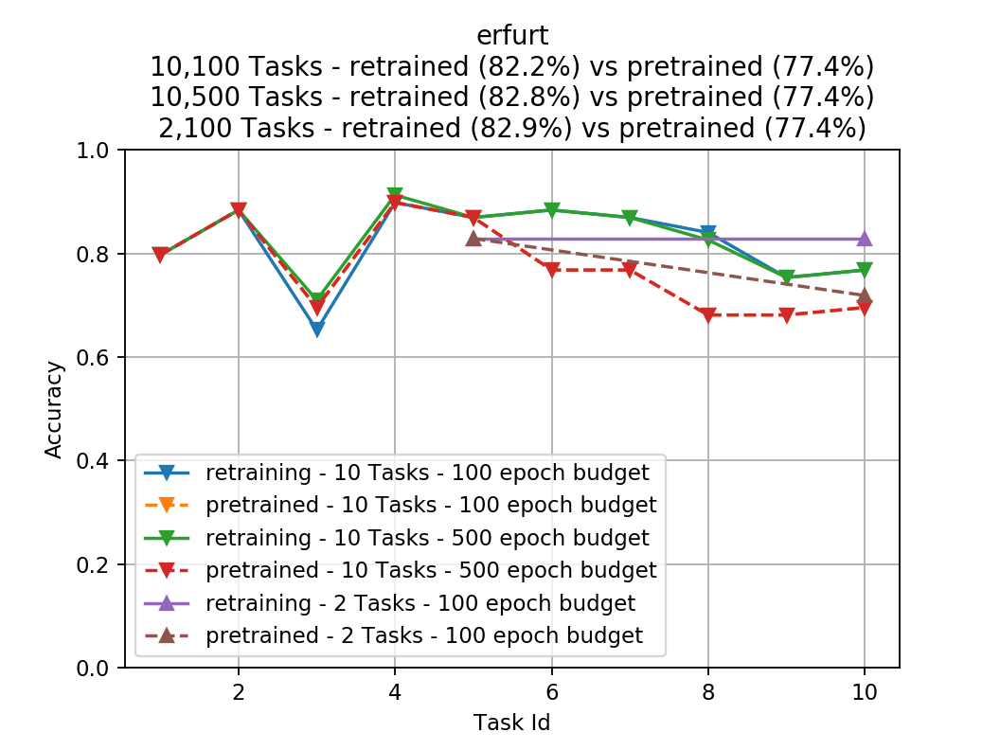

<IPython.core.display.Javascript object>


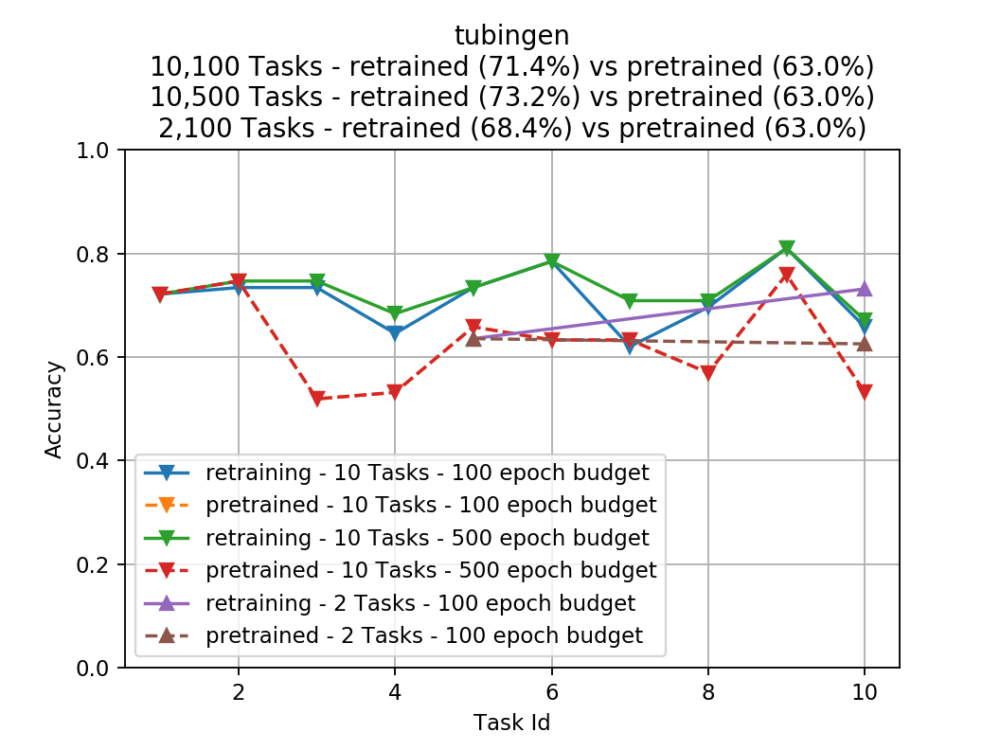

In [17]:
result_roots = [('/home/romilb/research/msr/results/motivation/10tasks_10epochs/', ['100']),
               ('/home/romilb/research/msr/results/motivation/10tasks/', ['500']),
               ('/home/romilb/research/msr/results/motivation/2tasks/', ['100'])]
pretrained_files = (glob.glob(result_roots[0][0] + "*_retraining_result.json"))
city_names = [os.path.basename(x).split('_retraining_result.json')[0] for x in pretrained_files]
print(city_names)

suffixes = ['_retraining_result.json', '_pretrained_result.json']

BASE_NUM_TASKS = 10

acc_dict = defaultdict(dict)
for city in city_names:
    fig=plt.figure()
    fig.tight_layout()
    plt.subplots_adjust(top=0.8)
    title_text = ""
    for res_root, [budget] in result_roots:
        for suffix in suffixes:
            task_ids, acc = get_data(city, res_root, suffix=suffix)
            num_tasks = len(task_ids)
            interpolated_taskids = [(x+1)*int(BASE_NUM_TASKS/num_tasks) for x in task_ids]
            
            marker = get_marker(num_tasks)
            label_suffix = 'retraining' if suffix == '_retraining_result.json' else 'pretrained'
            linestyle = get_ls(label_suffix)
            plt.plot(interpolated_taskids, acc, marker=marker, ls=linestyle,
                     label="{} - {} Tasks - {} epoch budget".format(label_suffix, str(num_tasks), budget))
            if label_suffix == 'retraining':
                retraining_acc = acc
                acc_dict[city][num_tasks] = (interpolated_taskids, acc)
            elif label_suffix == 'pretrained':
                pretrained_acc = acc
                #acc_dict[city]['pretrained'] = (task_ids, acc)
        title_text += "\n{},{} Tasks - retrained ({:.1f}%) vs pretrained ({:.1f}%)".format(num_tasks, budget,
                                                                                        np.mean(retraining_acc)*100,
                                                                                        np.mean(pretrained_acc)*100)
            
    plt.legend()
    plt.title("{}{}".format(city, title_text))
    plt.ylim([0,1])
    plt.xlabel('Task Id')
    plt.ylabel('Accuracy')
    plt.savefig(os.path.join('/home/romilb/research/msr/results/motivation/combined_2_5_10/resource_budget_comparison', "{}.png".format(city)))
    plt.grid()